In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

from torchvision.transforms.functional import to_pil_image
def display(img):
    temp = img
    temp -= temp.min()
    temp /= temp.max()

    return to_pil_image(temp)

[10:29:48.397729] [10:29:48.397727] [10:29:48.397826] [10:29:48.397724] [10:29:48.397842] [10:29:48.397841] [10:29:48.397855] [10:29:48.397706] [10:29:48.397871] [10:29:48.397870] [10:29:48.397884] [10:29:48.397869] [10:29:48.397899] [10:29:48.397897] [10:29:48.397911] Device


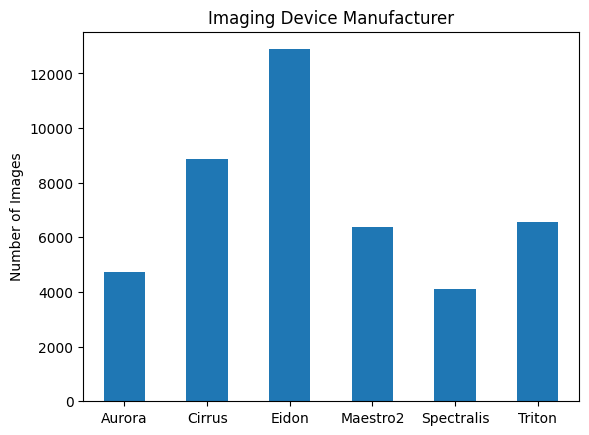

In [29]:
df = pd.concat([pd.read_csv(f'/data/7TB/nick/ai_readi/synth_fundus/{x}.csv',index_col=0) for x in ['train', 'test', 'val']])
df

devices = ['Aurora','Cirrus','Eidon','Maestro2','Spectralis','Triton']
laterality = ['L', 'R']
position = ['Macula', 'Macula or Optic Disc', 'Mosaic', 'Nasal', 'Optic Disc',
       'Temporal Periphery', 'Wide Field']
image_type = ['Autofluorescence', 'Color Photography', 'Infrared Reflectance']
conditions = ['AMD', 'DR', 'GL']

print("Device")
df[devices].sum().plot(kind='bar', title='Imaging Device Manufacturer', ylabel='Number of Images', rot=0)
plt.show()

In [31]:
df[conditions].value_counts()

AMD  DR  GL
0    0   0     36462
         1      3105
1    0   0      1564
0    1   0      1308
1    1   1       372
0    1   1       360
1    0   1       260
     1   0        89
Name: count, dtype: int64

Anatomic Region


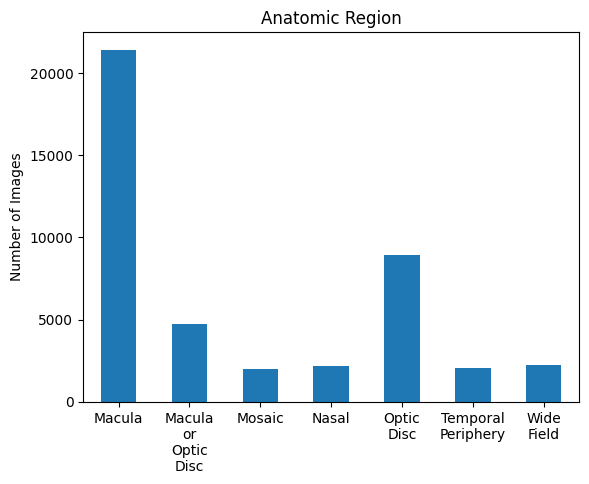

In [3]:
print("Anatomic Region")
df[position].sum().rename(index={x: x.replace(' ', '\n') for x in position}).plot(kind='bar', title='Anatomic Region', ylabel='Number of Images', rot=0)
plt.show()

Imaging Type


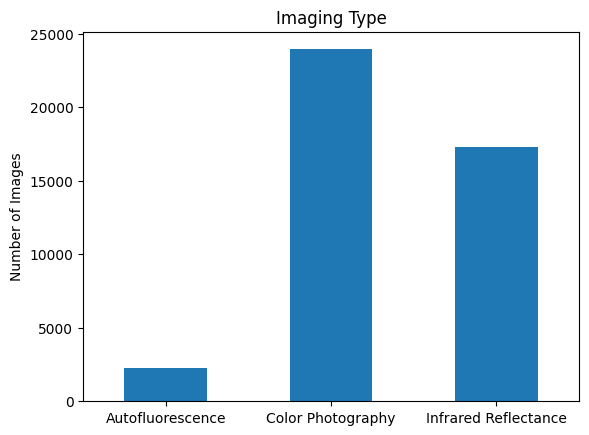

In [4]:
print("Imaging Type")
df[image_type].sum().plot(kind='bar', title='Imaging Type', ylabel='Number of Images', rot=0)
plt.show()

Conditions


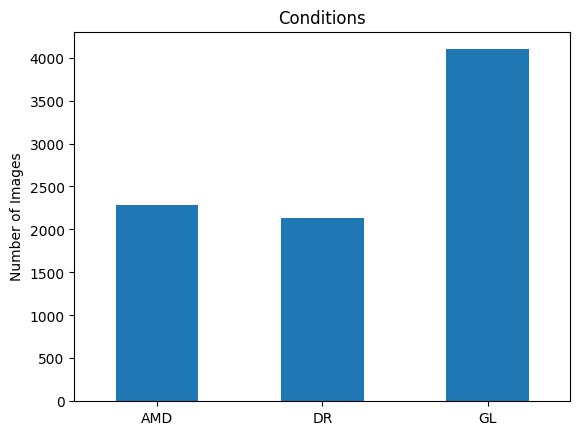

In [5]:
print("Conditions")
df[conditions].sum().plot(kind='bar', title='Conditions', ylabel='Number of Images', rot=0)
plt.show()

## Synthetic Image Utility
The script 'Synthetic_AI_READI_Demo/finetune_RETFound_Synth_Fundus.sh' generated these results

In [6]:
# Read in results
df = {
    'modality': [],
    'task': [],
    'train': [],
    'test': [],
    'AUC': [],
    'Precision': [],
    'Recall': []
}
for folder in os.listdir('output_dir'):
    temp = folder.split('_')
    df['modality'].append(temp[0])
    df['task'].append("_".join(temp[1:-2]))
    df['train'].append(temp[-2])
    df['test'].append(temp[-1])
    res = pd.read_csv('output_dir/{}/metrics_test.csv'.format(folder), index_col=None)
    df['AUC'].append(res.loc[0, 'roc_auc'])
    df['Precision'].append(res.loc[0, 'precision'])
    df['Recall'].append(res.loc[0, 'recall'])

df = pd.DataFrame(df)
df['label'] = df['train'] + '-to-' + df['test']

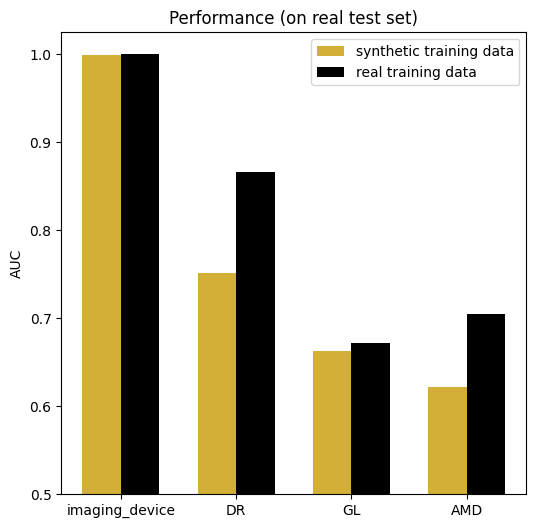

In [7]:
# Performance on real test data
def bar_results(test_data = 'real'):

    width = 0.5
    counter = 0
    temp = df.set_index('label').loc[[f'synth-to-{test_data}', f'real-to-{test_data}']]
    for task in ['imaging_device', 'DR', 'GL', 'AMD']:
        temp1 = temp[temp['task'] == task]
        if counter == 0:
            labs = ['synthetic training data','real training data']
        else:
            labs = [None, None]
        plt.bar(counter, temp1.iloc[0]['AUC'], width=width, color='#D4AF37', label=labs[0])
        plt.bar(counter+width, temp1.iloc[1]['AUC'], width=width, color='black', label=labs[1])

        counter += 1+width
        
    plt.xticks(np.linspace(width/2, 4 + width * 1.5, 4), ['imaging_device', 'DR', 'GL', 'AMD'])
    plt.legend()

    plt.title(f"Performance (on {test_data} test set)")
    plt.ylabel("AUC")
    plt.ylim([0.5, 1.025])


#
plt.figure(figsize=(6,6))

bar_results('real')



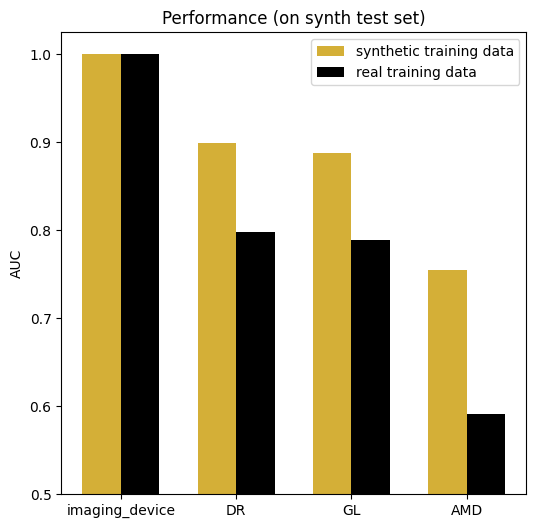

In [8]:
plt.figure(figsize=(6,6))
bar_results('synth')

In [26]:
# Utilities to load in model & data
def get_args_parser():
    import argparse
    parser = argparse.ArgumentParser('MAE fine-tuning for image classification', add_help=False)
    parser.add_argument('--batch_size', default=128, type=int,
                        help='Batch size per GPU (effective batch size is batch_size * accum_iter * # gpus')
    parser.add_argument('--epochs', default=50, type=int)
    parser.add_argument('--accum_iter', default=1, type=int,
                        help='Accumulate gradient iterations (for increasing the effective batch size under memory constraints)')

    # Model parameters
    parser.add_argument('--model', default='vit_large_patch16', type=str, metavar='MODEL',
                        help='Name of model to train')
    parser.add_argument('--input_size', default=256, type=int,
                        help='images input size')
    parser.add_argument('--drop_path', type=float, default=0.2, metavar='PCT',
                        help='Drop path rate (default: 0.1)')

    # Optimizer parameters
    parser.add_argument('--clip_grad', type=float, default=None, metavar='NORM',
                        help='Clip gradient norm (default: None, no clipping)')
    parser.add_argument('--weight_decay', type=float, default=0.05,
                        help='weight decay (default: 0.05)')
    parser.add_argument('--lr', type=float, default=None, metavar='LR',
                        help='learning rate (absolute lr)')
    parser.add_argument('--blr', type=float, default=5e-3, metavar='LR',
                        help='base learning rate: absolute_lr = base_lr * total_batch_size / 256')
    parser.add_argument('--layer_decay', type=float, default=0.65,
                        help='layer-wise lr decay from ELECTRA/BEiT')
    parser.add_argument('--min_lr', type=float, default=1e-6, metavar='LR',
                        help='lower lr bound for cyclic schedulers that hit 0')
    parser.add_argument('--warmup_epochs', type=int, default=10, metavar='N',
                        help='epochs to warmup LR')

    # Augmentation parameters
    parser.add_argument('--color_jitter', type=float, default=None, metavar='PCT',
                        help='Color jitter factor (enabled only when not using Auto/RandAug)')
    parser.add_argument('--aa', type=str, default='rand-m9-mstd0.5-inc1', metavar='NAME',
                        help='Use AutoAugment policy. "v0" or "original". " + "(default: rand-m9-mstd0.5-inc1)'),
    parser.add_argument('--smoothing', type=float, default=0.1,
                        help='Label smoothing (default: 0.1)')

    # * Random Erase params
    parser.add_argument('--reprob', type=float, default=0.25, metavar='PCT',
                        help='Random erase prob (default: 0.25)')
    parser.add_argument('--remode', type=str, default='pixel',
                        help='Random erase mode (default: "pixel")')
    parser.add_argument('--recount', type=int, default=1,
                        help='Random erase count (default: 1)')
    parser.add_argument('--resplit', action='store_true', default=False,
                        help='Do not random erase first (clean) augmentation split')

    # * Mixup params
    parser.add_argument('--mixup', type=float, default=0,
                        help='mixup alpha, mixup enabled if > 0.')
    parser.add_argument('--cutmix', type=float, default=0,
                        help='cutmix alpha, cutmix enabled if > 0.')
    parser.add_argument('--cutmix_minmax', type=float, nargs='+', default=None,
                        help='cutmix min/max ratio, overrides alpha and enables cutmix if set (default: None)')
    parser.add_argument('--mixup_prob', type=float, default=1.0,
                        help='Probability of performing mixup or cutmix when either/both is enabled')
    parser.add_argument('--mixup_switch_prob', type=float, default=0.5,
                        help='Probability of switching to cutmix when both mixup and cutmix enabled')
    parser.add_argument('--mixup_mode', type=str, default='batch',
                        help='How to apply mixup/cutmix params. Per "batch", "pair", or "elem"')

    # * Finetuning params
    parser.add_argument('--finetune', default='', type=str,
                        help='finetune from checkpoint')
    parser.add_argument('--task', default='', type=str,
                        help='select the label to be predicted')
    parser.add_argument('--global_pool', action='store_true')
    parser.set_defaults(global_pool=True)
    parser.add_argument('--cls_token', action='store_false', dest='global_pool',
                        help='Use class token instead of global pool for classification')

    # Dataset parameters
    parser.add_argument('--data_path', default='./data/', type=str,
                        help='dataset path')
    parser.add_argument('--nb_classes', default=8, type=int,
                        help='number of the classification types')
    parser.add_argument('--output_dir', default='./output_dir',
                        help='path where to save, empty for no saving')
    parser.add_argument('--log_dir', default='./output_logs',
                        help='path where to tensorboard log')
    parser.add_argument('--device', default='cuda:3',
                        help='device to use for training / testing')
    parser.add_argument('--seed', default=0, type=int)
    parser.add_argument('--resume', default='',
                        help='resume from checkpoint')
    parser.add_argument('--start_epoch', default=0, type=int, metavar='N',
                        help='start epoch')
    parser.add_argument('--eval', action='store_true',
                        help='Perform evaluation only')
    parser.add_argument('--dist_eval', action='store_true', default=False,
                        help='Enabling distributed evaluation (recommended during training for faster monitor')
    parser.add_argument('--num_workers', default=10, type=int)
    parser.add_argument('--pin_mem', action='store_true',
                        help='Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.')
    
    parser.add_argument('--modality', default='fundus',
                        help='Select which modality the models will be trained on (retinal fundus images or OCT scans)')
    parser.add_argument('--train_dataset', default='synth',
                        help='Select whether models will be trained on real vs synthetic data')
    parser.add_argument('--test_dataset', default='synth',
                        help='Select whether models will be tested on real vs synthetic data')
    
    parser.set_defaults(pin_mem=True)

    # distributed training parameters
    parser.add_argument('--world_size', default=1, type=int,
                        help='number of distributed processes')
    parser.add_argument('--local_rank', default=-1, type=int)
    parser.add_argument('--dist_on_itp', action='store_true')
    parser.add_argument('--distributed', action='store_true', default=True)
    parser.add_argument('--dist_url', default='env://',
                        help='url used to set up distributed training')

    # fine-tuning parameters
    parser.add_argument('--savemodel', action='store_true', default=True,
                        help='Save model')
    parser.add_argument('--norm', default='IMAGENET', type=str, help='Normalization method')
    parser.add_argument('--enhance', action='store_true', default=False, help='Use enhanced data')
    parser.add_argument('--datasets_seed', default=2026, type=int)

    return parser

def load_model_data(real=True):
    import datetime
    import json

    import numpy as np
    import os
    import time
    from pathlib import Path

    import torch
    import torch.backends.cudnn as cudnn
    from torch.utils.tensorboard import SummaryWriter
    from timm.models.layers import trunc_normal_
    from timm.data.mixup import Mixup

    import models_vit as models
    import util.lr_decay as lrd
    import util.misc as misc
    from util.datasets import build_dataset
    from util.pos_embed import interpolate_pos_embed
    from util.misc import NativeScalerWithGradNormCount as NativeScaler
    from huggingface_hub import hf_hub_download, login

    import warnings
    import faulthandler

    faulthandler.enable()
    warnings.simplefilter(action='ignore', category=FutureWarning)
    args = get_args_parser()
    args = args.parse_args()

    args.batch_size = 4096
    args.world_size = 1
    args.epochs = 1
    #args.eval = True
    args.global_pool = True
    args.warmup_epochs = 0
    args.blr = 5e-3
    args.layer_decay = 0.65
    args.weight_decay = 0.05
    args.drop_path = 0.2
    args.nb_classes = 2
    args.data_path = '/data/7TB/nick/ai_readi/'
    args.input_size = 224
    args.task = 'GL'
    if real:
        args.resume = 'output_dir/fundus_DR_real_real/checkpoint-best.pth'
    else:
        args.resume = 'output_dir/fundus_DR_synth_synth/checkpoint-best.pth'
    args.finetune = 'RETFound_mae_meh'
    args.model = 'RETFound_mae'

    misc.init_distributed_mode(args)

    device = torch.device(args.device)

    # fix the seed for reproducibility
    seed = args.seed + misc.get_rank()
    torch.manual_seed(seed)
    np.random.seed(seed)

    cudnn.benchmark = True

    model = models.__dict__[args.model](
    img_size=args.input_size,
    num_classes=args.nb_classes,
    drop_path_rate=args.drop_path,
    global_pool=args.global_pool,
    )
    classes = [args.task, 'not_'+args.task]

    from util.datasets import SyntheticRetinalImageDataset, RetinalImageDataset

    # Training dataset
    dataset_real = RetinalImageDataset(args, classes, 'test', demo=True)
    dataset_synth = SyntheticRetinalImageDataset(args, classes, 'test', demo=True)

    sampler_real = torch.utils.data.SequentialSampler(dataset_real)
    sampler_synth = torch.utils.data.SequentialSampler(dataset_synth)

    data_loader_real = torch.utils.data.DataLoader(
                dataset_real, sampler=sampler_real,
                batch_size=args.batch_size,
                num_workers=args.num_workers,
                pin_memory=args.pin_mem,
                drop_last=True,
            )
    data_loader_synth = torch.utils.data.DataLoader(
                dataset_synth, sampler=sampler_synth,
                batch_size=args.batch_size,
                num_workers=args.num_workers,
                pin_memory=args.pin_mem,
                drop_last=True,
            )

    checkpoint = torch.load(args.resume, map_location='cpu', weights_only=False)
    print("Load checkpoint from: %s" % args.resume)
    model.load_state_dict(checkpoint['model'])

    model.to(device)

    return model, data_loader_real, data_loader_synth, device

real_model, data_loader_real, data_loader_synth, device = load_model_data(real=True)
synth_model, _, __, ___ = load_model_data(real=False)

[10:15:49.494704] [10:15:49.494687] [10:15:49.494778] Not using distributed mode
[10:15:53.320341] [10:15:53.320336] [10:15:53.320442] [10:15:53.320314] [10:15:53.320459] [10:15:53.320457] [10:15:53.320473] Load checkpoint from: output_dir/fundus_DR_real_real/checkpoint-best.pth
[10:15:53.981884] [10:15:53.981881] [10:15:53.982097] [10:15:53.981859] [10:15:53.982114] [10:15:53.982112] [10:15:53.982127] Not using distributed mode
[10:15:57.804758] [10:15:57.804753] [10:15:57.804985] [10:15:57.804748] [10:15:57.805001] [10:15:57.804999] [10:15:57.805014] [10:15:57.804719] [10:15:57.805029] [10:15:57.805028] [10:15:57.805041] [10:15:57.805026] [10:15:57.805055] [10:15:57.805053] [10:15:57.805067] Load checkpoint from: output_dir/fundus_DR_synth_synth/checkpoint-best.pth


In [10]:
# Load in data
real_img_norm, real_label, real_img = next(iter(data_loader_real))
real_img_norm, real_label, real_img = real_img_norm.to(device), real_label.to(device), real_img.to(device)

synth_img_norm, synth_label, synth_img = next(iter(data_loader_synth))
synth_img_norm, synth_label, synth_img = synth_img_norm.to(device), synth_label.to(device), synth_img.to(device)


cols = ['GL']#, 'Eidon', 'Color Photography']
synth_df = data_loader_synth.dataset.df
inds = np.where((synth_df[cols] == 1).all(axis=1))[0][0:64]

real_df = data_loader_real.dataset.df
inds2 = np.where(real_df['GL'] == 1)[0][0:64]#np.where(pd.concat([real_df['manufacturers_model_name'] == 'Eidon', real_df['imaging'] == 'Color Photography', real_df['anatomic_region'] == 'Macula', real_df['DR'] == 1], axis=1).all(axis=1))[0][0:64]

synth = synth_img_norm[inds[0]]
real = real_img_norm[inds2[0]]

In [11]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch 

from PIL import Image

def reshape_transform(tensor):
    # tensor has shape (B, N, C) where N includes the CLS token.
    B, N, C = tensor.shape
    # Remove the CLS token.
    token_seq = tensor[:, 1:, :]
    # Compute the spatial size: assume square grid.
    spatial_dim = int((N - 1) ** 0.5)
    assert spatial_dim * spatial_dim == (N - 1), "Number of tokens (excluding CLS) is not a perfect square"
    result = token_seq.reshape(B, spatial_dim, spatial_dim, C)
    # Bring channels to first dimension: result shape (B, C, spatial_dim, spatial_dim)
    result = result.transpose(2, 3).transpose(1, 2)
    return result

def heatmap(model, ind, real=False):
    if real:
        img = real_img[ind].view(1,3,224,224)
        #lab = real_label[ind].view(1,2)
    else:
        img = synth_img[ind].view(1,3,224,224)
        #lab = synth_label[ind].view(1,2)

    targets = [ClassifierOutputTarget(0)]
    target_layers = [model.blocks[-1].norm1]

    with GradCAM(model=model, target_layers=target_layers, reshape_transform=reshape_transform) as cam:

        grayscale_cams = cam(input_tensor=img, targets=targets)
        cam_image = show_cam_on_image(torch.permute(img[0, :], (1,2, 0)).detach().cpu().numpy(), grayscale_cams[0, :], use_rgb=True)

    #cam = np.uint8(255*grayscale_cams[0, :])

    #cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*torch.permute(img[0, :], (1,2, 0)).detach().cpu().numpy()), cam_image))
    return Image.fromarray(images)

def compare_heatmap(real_model, synth_model, ind, real=True):
    img1 = heatmap(real_model, ind, real=real).resize((1024, 512))
    img2 = heatmap(synth_model, ind, real=real).resize((1024, 512))

    img = Image.new("RGB", (1024, 1024), 'black')
    img.paste(img1, (0,0))
    img.paste(img2, (0,512))
    return img

# Heatmap Analysis

Top row is heatmap from model trained on real data
Second row is from model trained on synth data


## Real Images

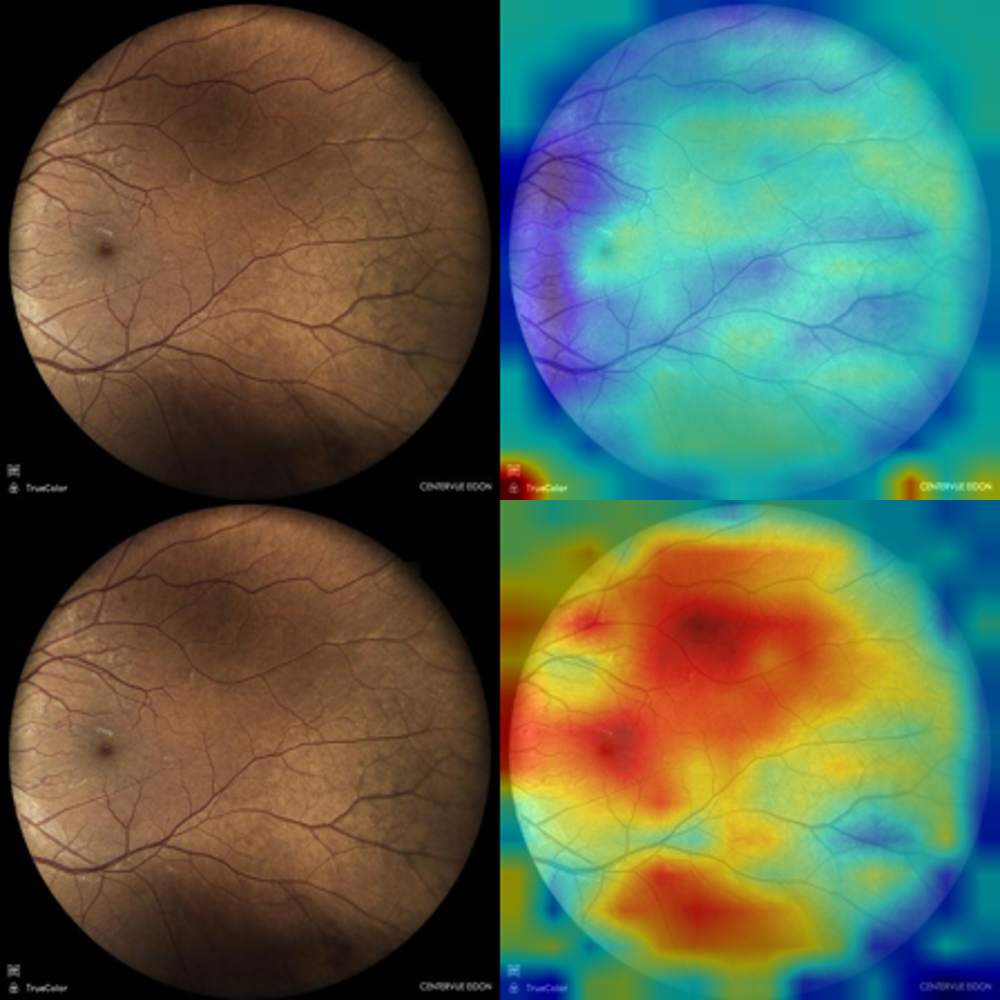

In [12]:
# 6, 50, 54, 59
# 20, 33
compare_heatmap(real_model, synth_model, inds2[6], real=True)

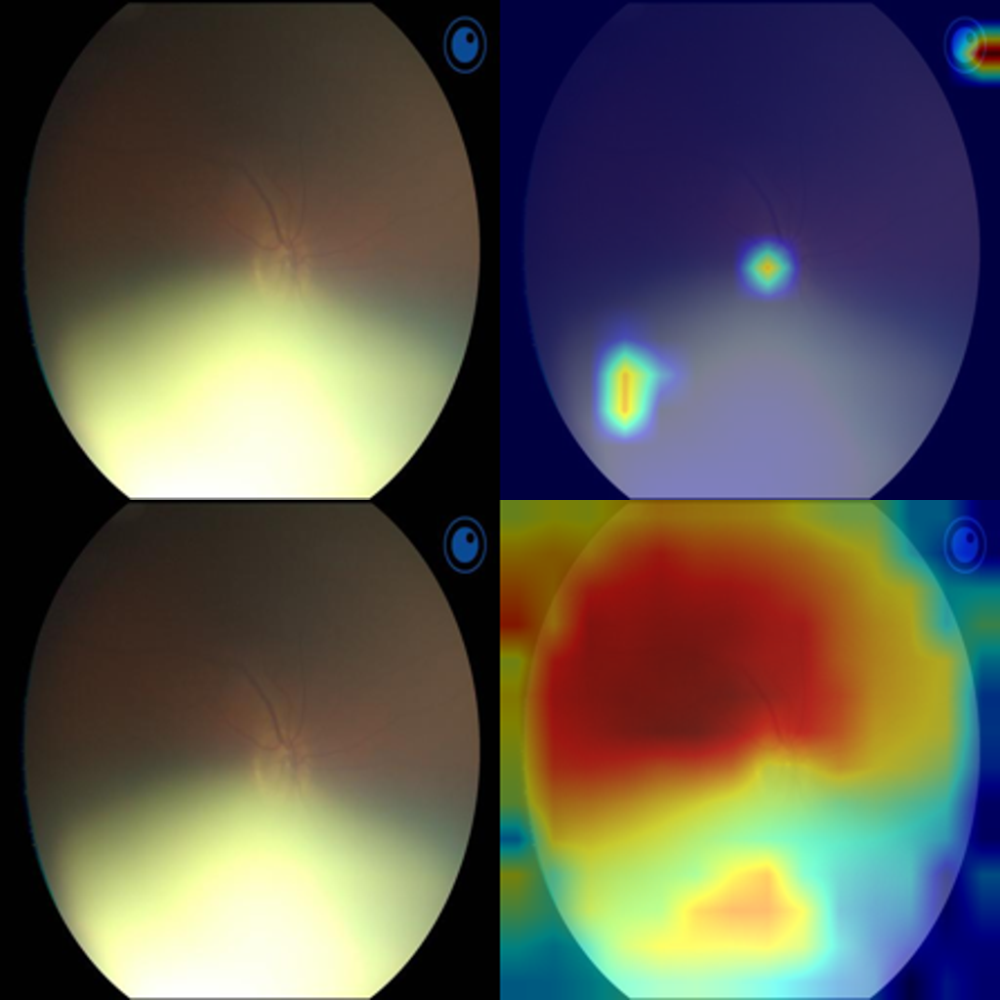

In [13]:
compare_heatmap(real_model, synth_model, inds2[50], real=True)

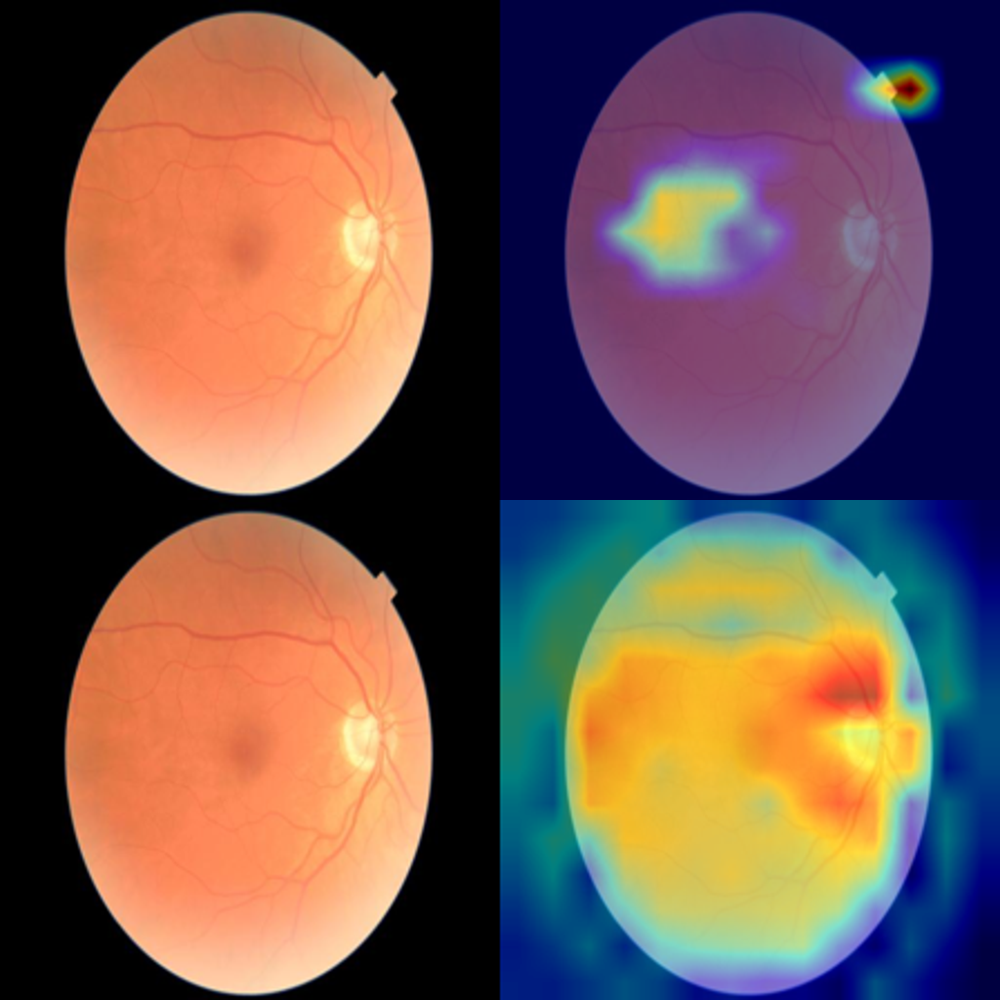

In [14]:
compare_heatmap(real_model, synth_model, inds2[54], real=True)

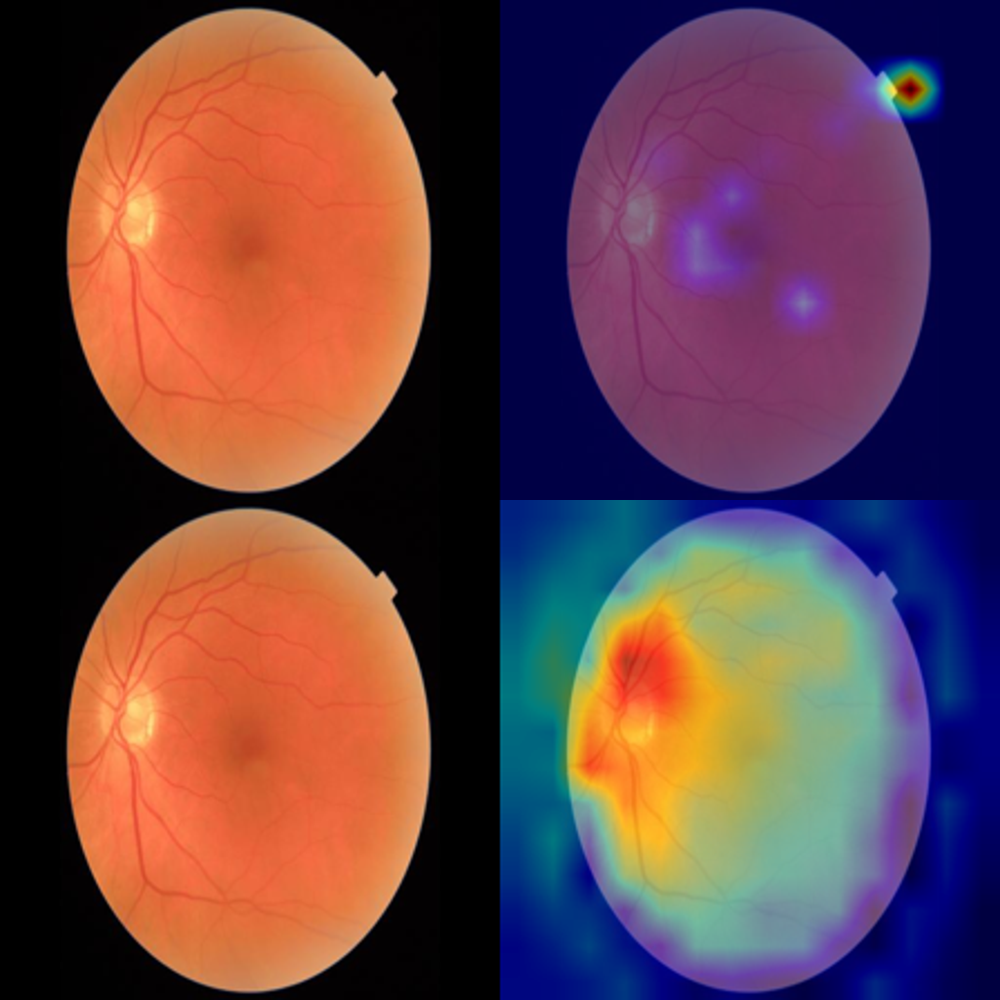

In [15]:
compare_heatmap(real_model, synth_model, inds2[59], real=True)

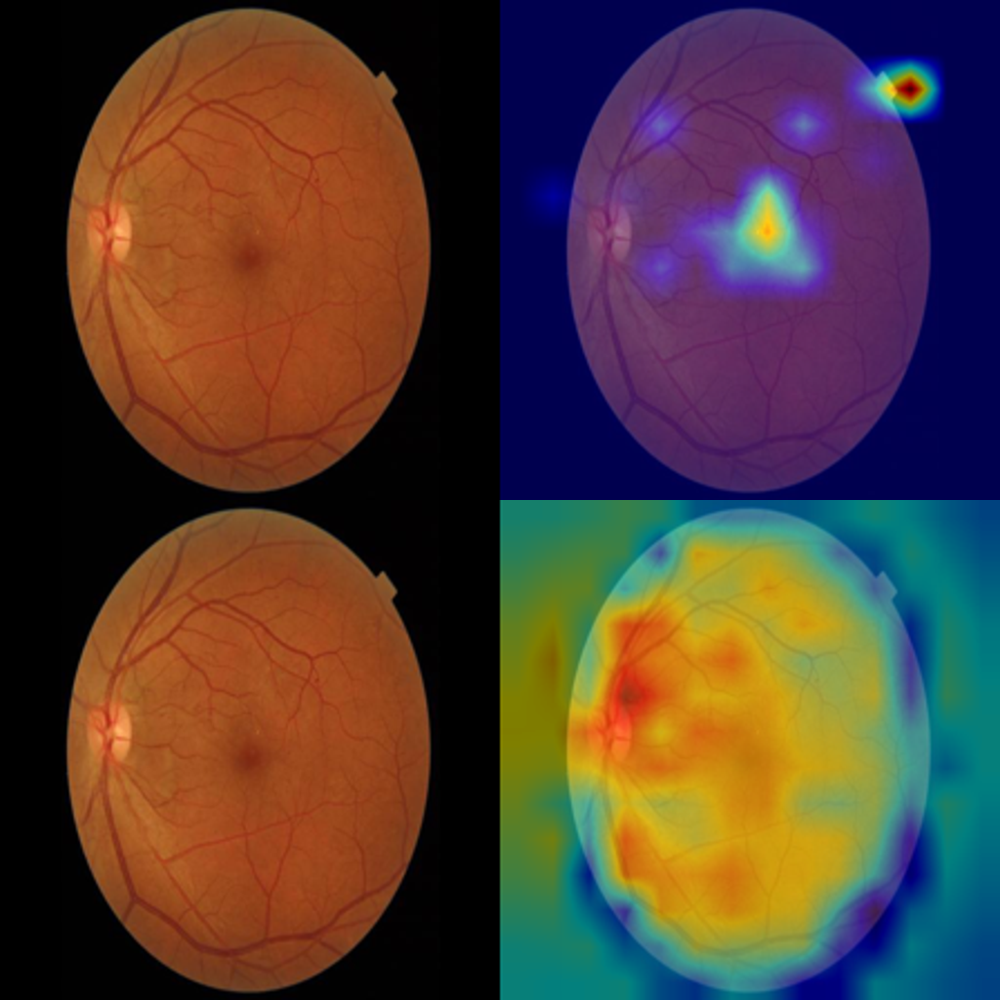

In [16]:
compare_heatmap(real_model, synth_model, inds2[20], real=True)

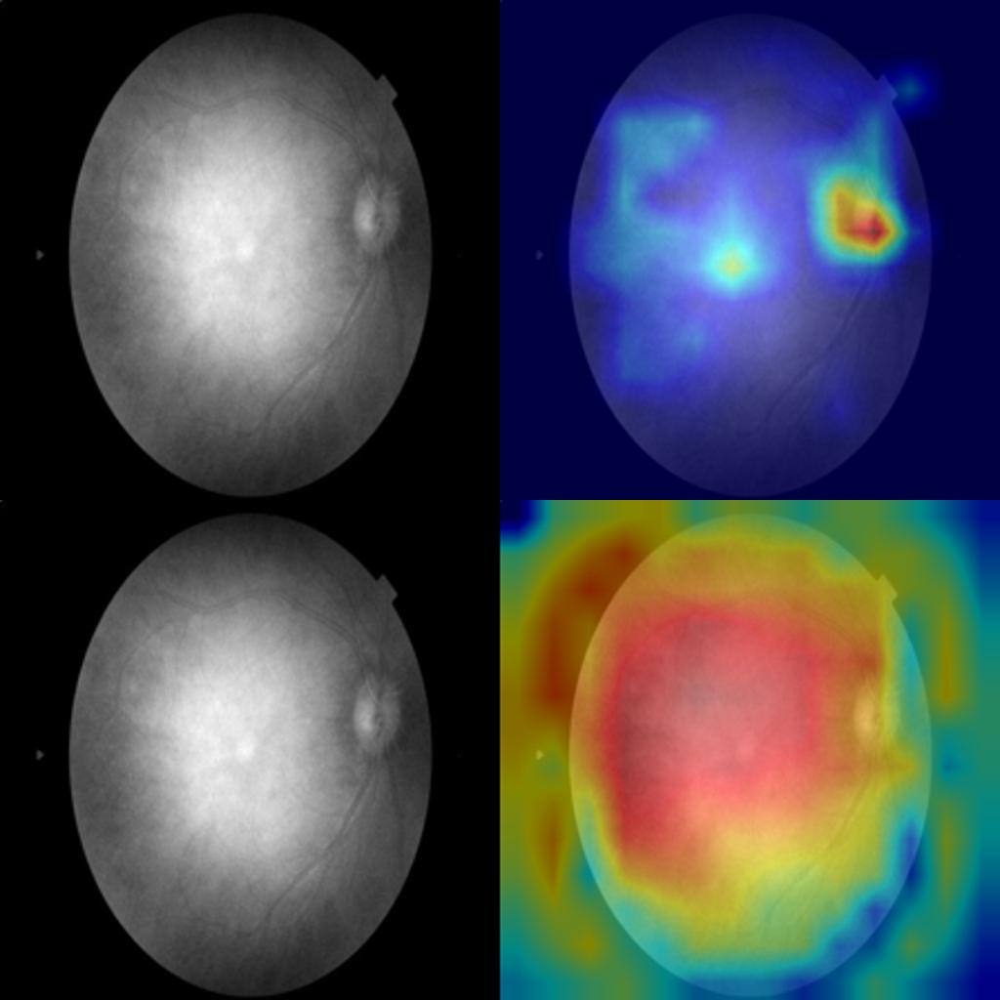

In [17]:
compare_heatmap(real_model, synth_model, inds2[33], real=True)

## Synth Images

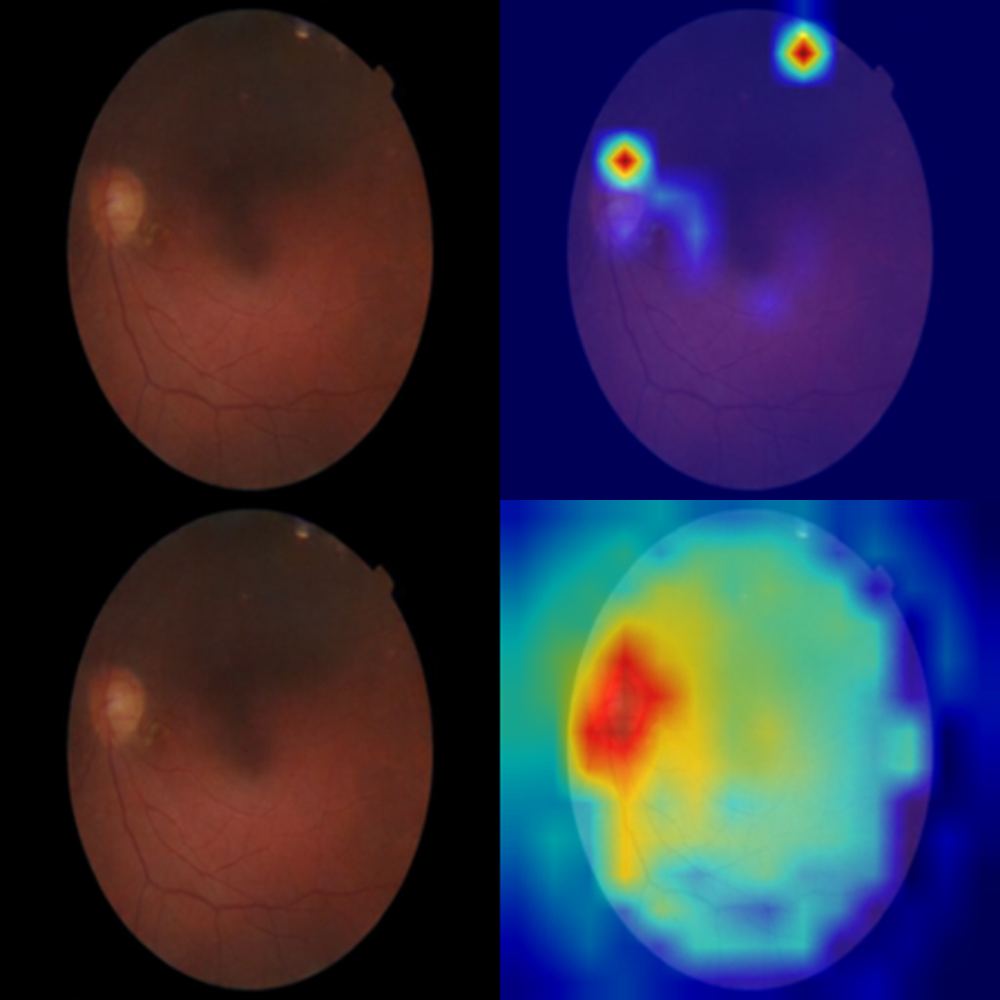

In [18]:
# 6, 24, 28, 29, 48, 54
compare_heatmap(real_model, synth_model, inds[6], real=False)

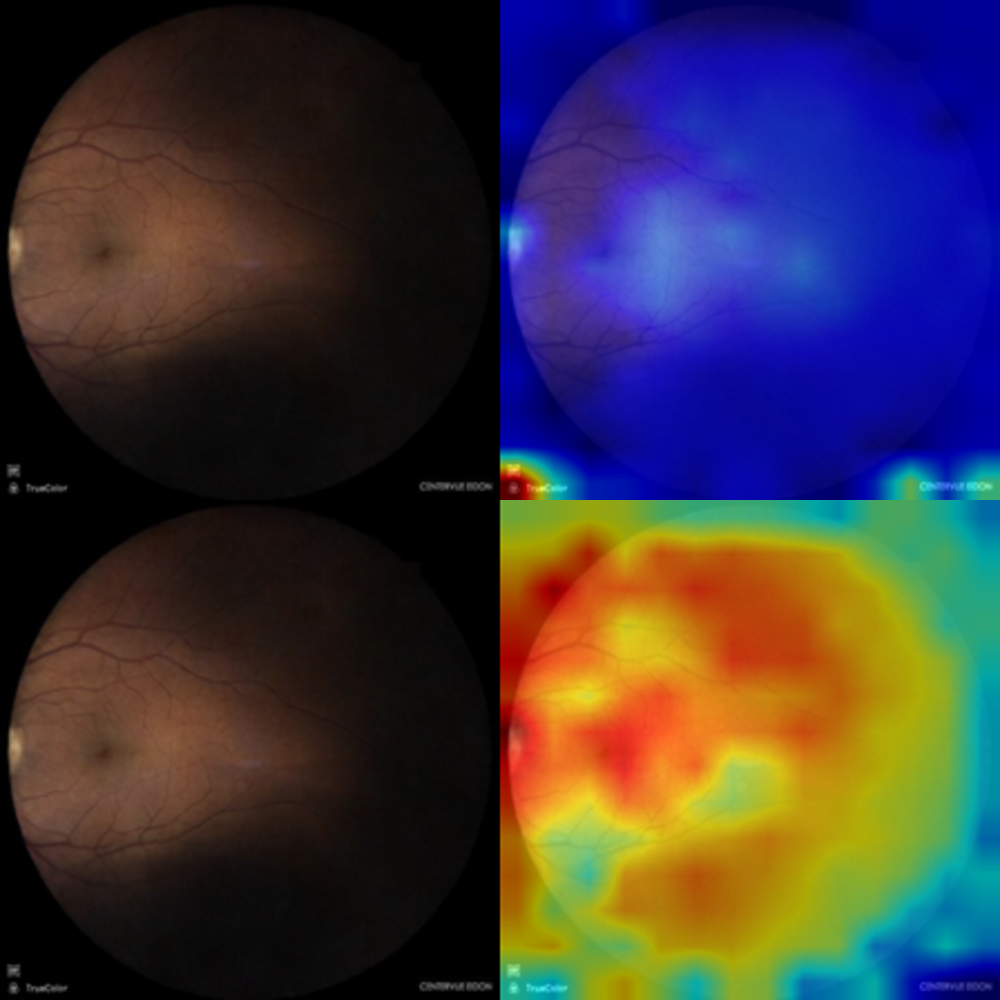

In [19]:
compare_heatmap(real_model, synth_model, inds[24], real=False)

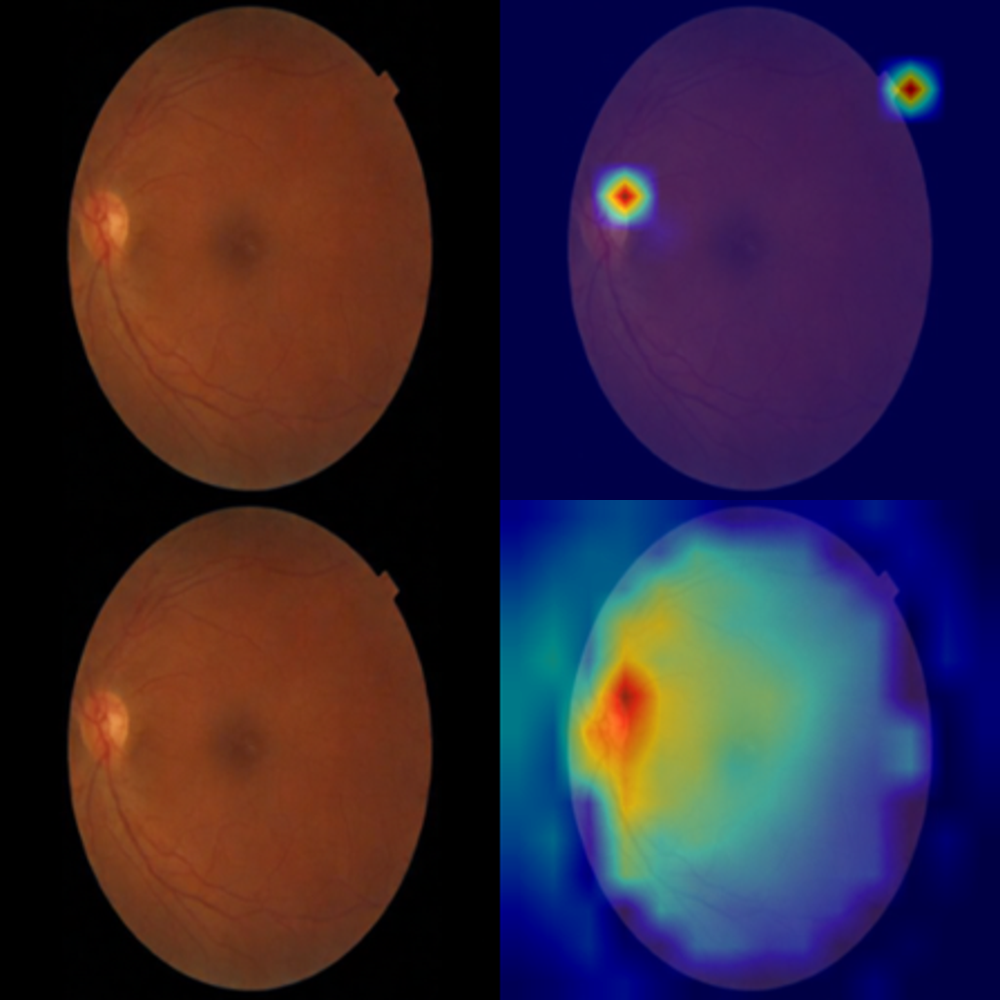

In [20]:
compare_heatmap(real_model, synth_model, inds[28], real=False)

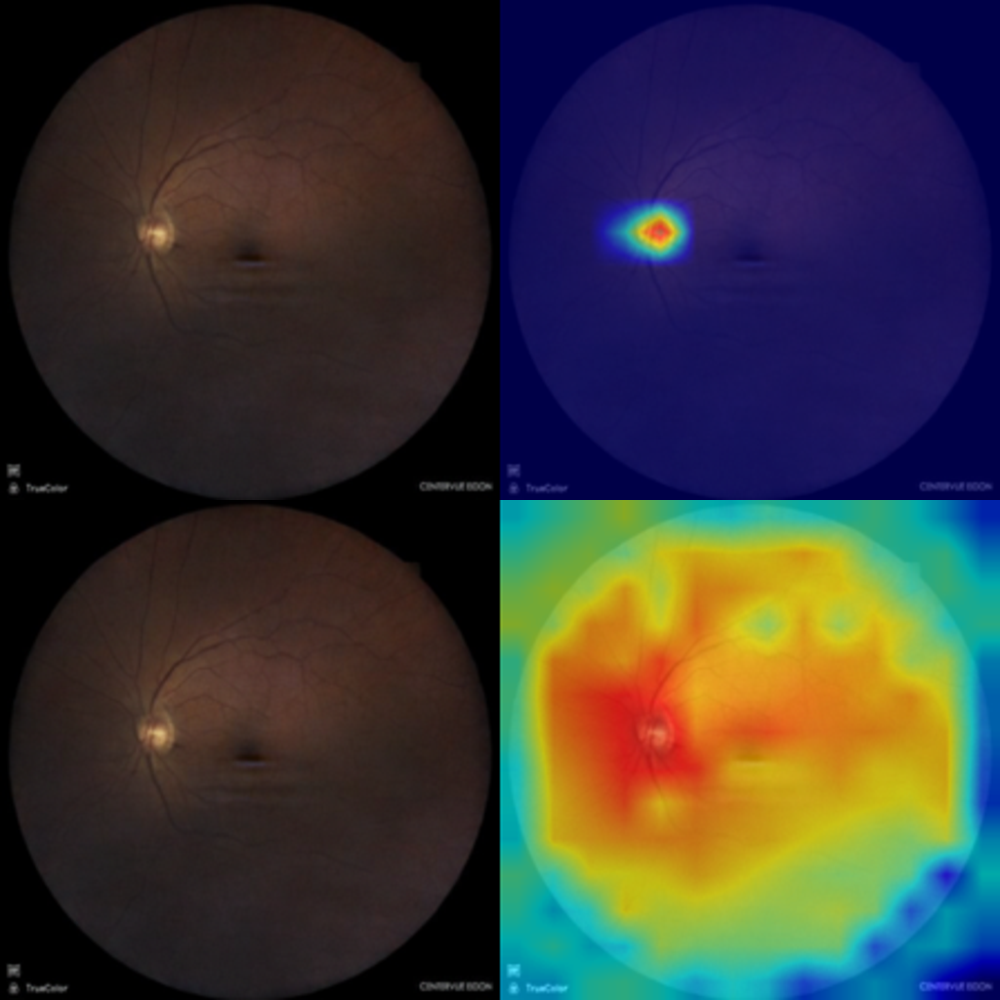

In [21]:
compare_heatmap(real_model, synth_model, inds[29], real=False)

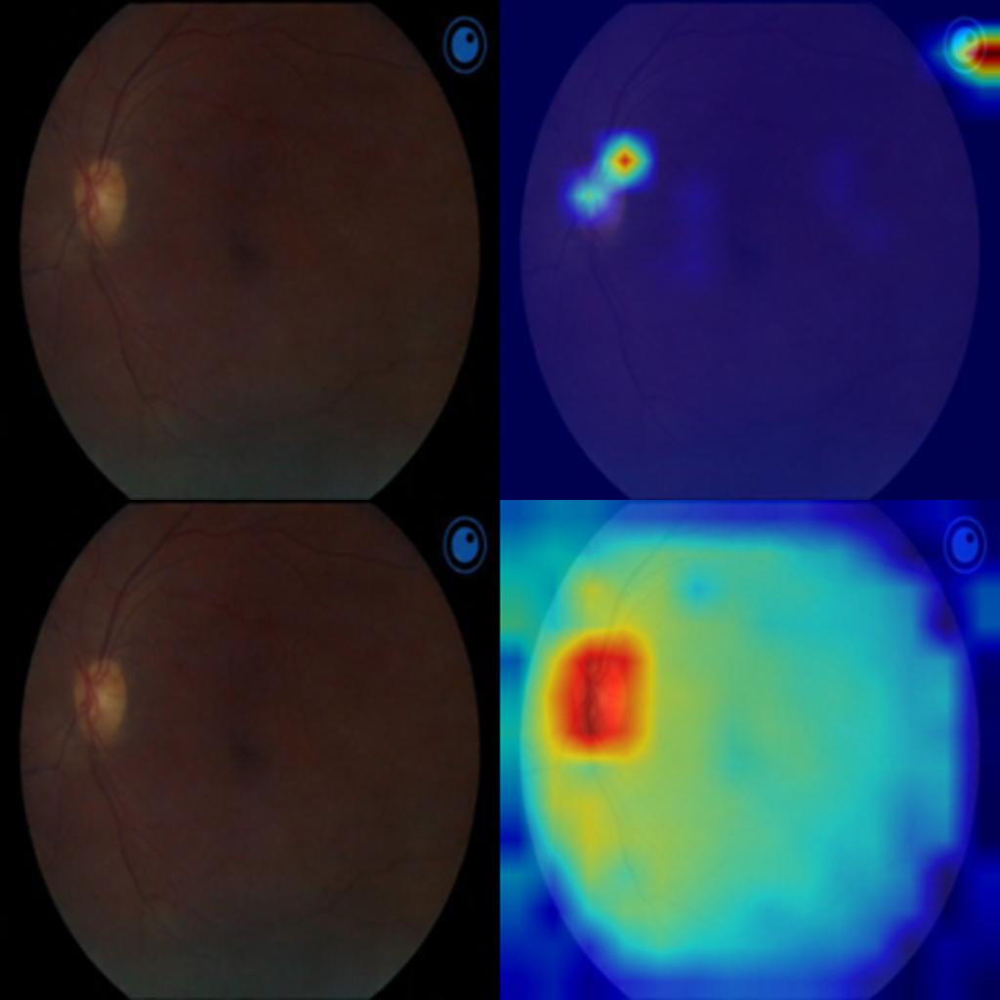

In [22]:
compare_heatmap(real_model, synth_model, inds[48], real=False)

## Complexity Comparison

In [23]:
import pandas as pd
import numpy as np

pd.set_option('display.max_colwidth', None)
np.random.seed(45)

# Load Data
real = pd.concat([pd.read_csv('/data/7TB/nick/ai_readi/resized_retinal_photography/{}_latents.csv'.format(x), index_col=0) for x in ['train', 'val', 'test']])#.iloc[0:1000, :]
real_vals = real.values[:, -1024:].astype(np.float32)

synthetic = pd.concat([pd.read_csv('/data/7TB/nick/ai_readi/synth_fundus/{}_latents.csv'.format(x), index_col=0) for x in ['train', 'val', 'test']])
synthetic_vals = synthetic.values[:, -1024:].astype(np.float32)

In [24]:
# PCA

from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(real_vals)

real_pca = pca.transform(real_vals)
synth_pca = pca.transform(synthetic_vals)

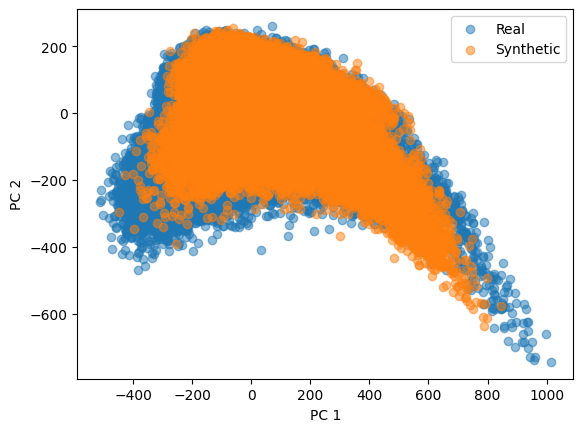

In [25]:
# Reduced variance in the synthetic data
plt.scatter(real_pca[:, 0], real_pca[:, 1], alpha=0.5, label='Real')
plt.scatter(synth_pca[:, 0], synth_pca[:, 1], alpha=0.5, label='Synthetic')
plt.legend()
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.show()